In [2]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

from numba.core.errors import NumbaDeprecationWarning
warnings.filterwarnings("ignore", category=NumbaDeprecationWarning)

필요한 모듈을 로드

In [3]:
import urllib.request
from pathlib import Path

import scanpy
import scanpy.plotting as plotting
scanpy.pl = plotting  # 👈 수동 alias 생성
import celltypist
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import scarches as sca
import seaborn as sns
from celltypist import models
from scipy.sparse import csr_matrix

/Users/yanghyejeong/miniforge3/envs/py_annotation/lib/python3.10/site-packages/celltypist/classifier.py:11: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('scanpy')` instead
  from scanpy import __version__ as scv
In order to use the mouse gastrulation seqFISH datsets, please install squidpy (see https://github.com/scverse/squidpy).
/Users/yanghyejeong/miniforge3/envs/py_annotation/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
In order to use sagenet models, please install pytorch geometric (see https://pytorch-geometric.readthedocs.io) and 
 captum (see https://github.com/pytorch/captum).
mvTCR is not installed. To use mvTCR models, please install it first using "pip install mvtcr"
multigrate is not installed. To use multigrate models, please install it first using "pip i

In [4]:
warnings.filterwarnings("ignore", category=pd.errors.PerformanceWarning)

In [5]:
# 매개변수 설정
sc.set_figure_params(figsize=(5,5))

In [6]:
# 데이터 로드
adata = sc.read(
    filename="s4d8_clustered.h5ad",
    backup_url="https://figshare.com/ndownloader/files/41436666",
)

In [7]:
marker_genes = {
    "CD14+ Mono": ["FCN1", "CD14"],
    "CD16+ Mono": ["TCF7L2", "FCGR3A", "LYN"],
    "ID2-hi myeloid prog": [
        "CD14",
        "ID2",
        "VCAN",
        "S100A9",
        "CLEC12A",
        "KLF4",
        "PLAUR",
    ],
    "cDC1": ["CLEC9A", "CADM1"],
    "cDC2": [
        "CST3",
        "COTL1",
        "LYZ",
        "DMXL2",
        "CLEC10A",
        "FCER1A",
    ],  # Note: DMXL2 should be negative
    "Normoblast": ["SLC4A1", "SLC25A37", "HBB", "HBA2", "HBA1", "TFRC"],
    "Erythroblast": ["MKI67", "HBA1", "HBB"],
    "Proerythroblast": [
        "CDK6",
        "SYNGR1",
        "HBM",
        "GYPA",
    ],  # Note HBM and GYPA are negative markers
    "NK": ["GNLY", "NKG7", "CD247", "GRIK4", "FCER1G", "TYROBP", "KLRG1", "FCGR3A"],
    "ILC": ["ID2", "PLCG2", "GNLY", "SYNE1"],
    "Lymph prog": [
        "VPREB1",
        "MME",
        "EBF1",
        "SSBP2",
        "BACH2",
        "CD79B",
        "IGHM",
        "PAX5",
        "PRKCE",
        "DNTT",
        "IGLL1",
    ],
    "Naive CD20+ B": ["MS4A1", "IL4R", "IGHD", "FCRL1", "IGHM"],
    "B1 B": [
        "MS4A1",
        "SSPN",
        "ITGB1",
        "EPHA4",
        "COL4A4",
        "PRDM1",
        "IRF4",
        "CD38",
        "XBP1",
        "PAX5",
        "BCL11A",
        "BLK",
        "IGHD",
        "IGHM",
        "ZNF215",
    ],  # Note IGHD and IGHM are negative markers
    "Transitional B": ["MME", "CD38", "CD24", "ACSM3", "MSI2"],
    "Plasma cells": ["MZB1", "HSP90B1", "FNDC3B", "PRDM1", "IGKC", "JCHAIN"],
    "Plasmablast": ["XBP1", "RF4", "PRDM1", "PAX5"],  # Note PAX5 is a negative marker
    "CD4+ T activated": ["CD4", "IL7R", "TRBC2", "ITGB1"],
    "CD4+ T naive": ["CD4", "IL7R", "TRBC2", "CCR7"],
    "CD8+ T": ["CD8A", "CD8B", "GZMK", "GZMA", "CCL5", "GZMB", "GZMH", "GZMA"],
    "T activation": ["CD69", "CD38"],  # CD69 much better marker!
    "T naive": ["LEF1", "CCR7", "TCF7"],
    "pDC": ["GZMB", "IL3RA", "COBLL1", "TCF4"],
    "G/M prog": ["MPO", "BCL2", "KCNQ5", "CSF3R"],
    "HSC": ["NRIP1", "MECOM", "PROM1", "NKAIN2", "CD34"],
    "MK/E prog": [
        "ZNF385D",
        "ITGA2B",
        "RYR3",
        "PLCB1",
    ],  # Note PLCB1 is a negative marker
}

In [8]:
marker_genes_in_data = {}
for ct, markers in marker_genes.items():
    markers_found = []
    for marker in markers:
        if marker in adata.var.index:
            markers_found.append(marker)
    marker_genes_in_data[ct] = markers_found

마커가 어디에서 발현되는지를 확인하기 위해 UMAP 같은 2차원 데이터 시각화를 활용할 수 있습니다.

스크랜 정규화된 카운트 데이터를 기반으로 고도로 편차가 큰 유전자만을 사용하여 UMAP을 구축합니다. UMAP을 생성하기 전에, 데이터의 차원을 줄이기 위해 정규화된 카운트에 PCA를 먼저 수행합니다.

먼지 원시 개수를 에 저장하여 .layers['counts'] 나중에 필요할 때 접근할 수 있도록 합니다. 그런 다음 을 adata.X 스크랜 정규화 및 로그 변환된 개수로 설정

In [9]:
adata.layers["counts"] = adata.X
adata.X = adata.layers["scran_normalization"]

In [10]:
adata.var["highly_variable"] = adata.var["highly_deviant"]

In [11]:
sc.tl.pca(adata, n_comps=50, use_highly_variable=True)

In [12]:
sc.pp.neighbors(adata)

In [13]:
sc.tl.umap(adata)

In [14]:
B_plasma_cts = [
    "Naive CD20+ B",
    "B1 B",
    "Transitional B",
    "Plasma cells",
    "Plasmablast",
]

NAIVE CD20+ B:


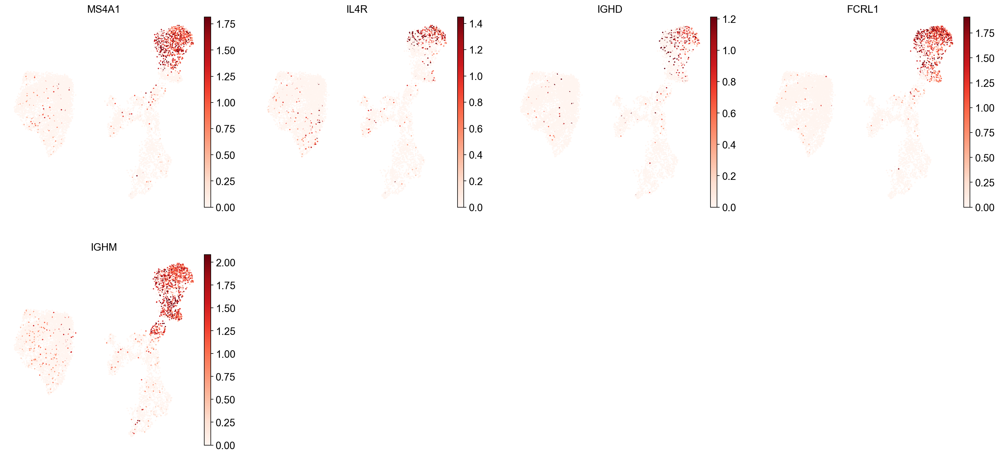





B1 B:


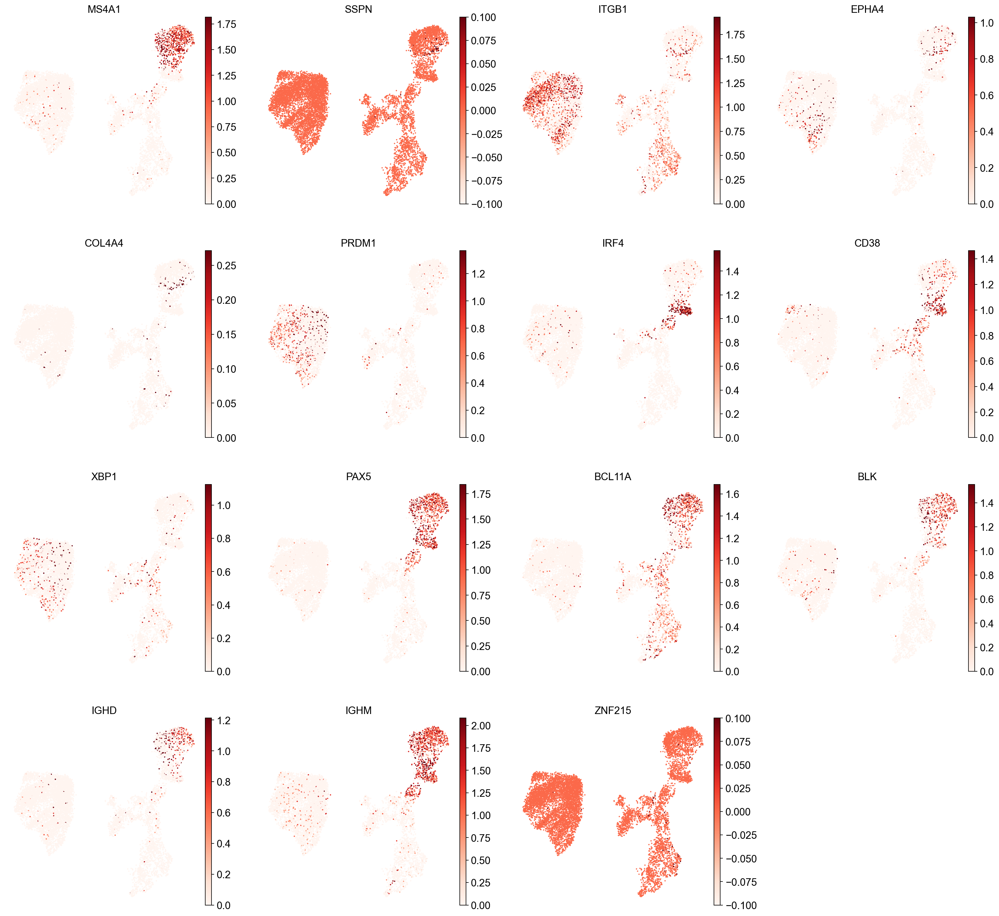





TRANSITIONAL B:


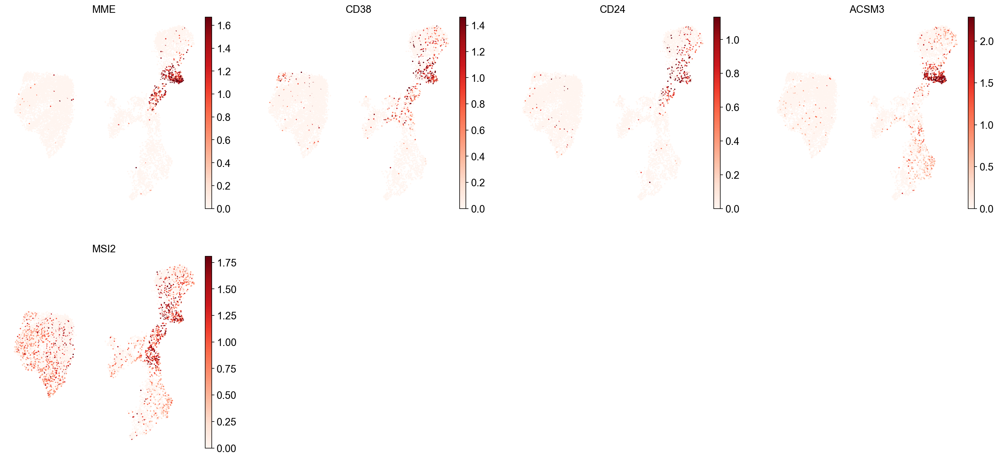





PLASMA CELLS:


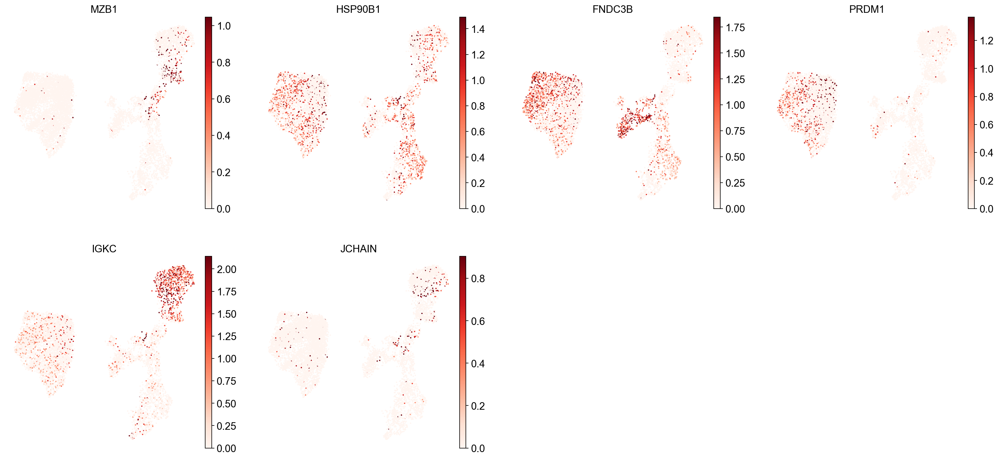





PLASMABLAST:


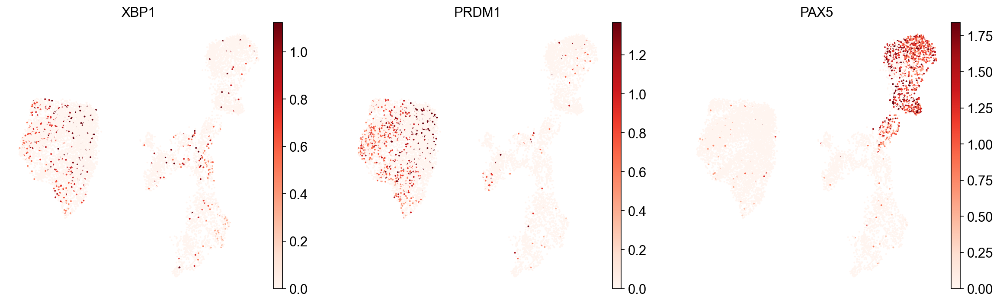

In [15]:
for ct in B_plasma_cts:
    print(f"{ct.upper()}:")  # print cell subtype name
    sc.pl.umap(
        adata,
        color=marker_genes_in_data[ct],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    )
    print("\n\n\n")  # print white space for legibility

In [16]:
sc.tl.leiden(adata, resolution=1, key_added="leiden_1")

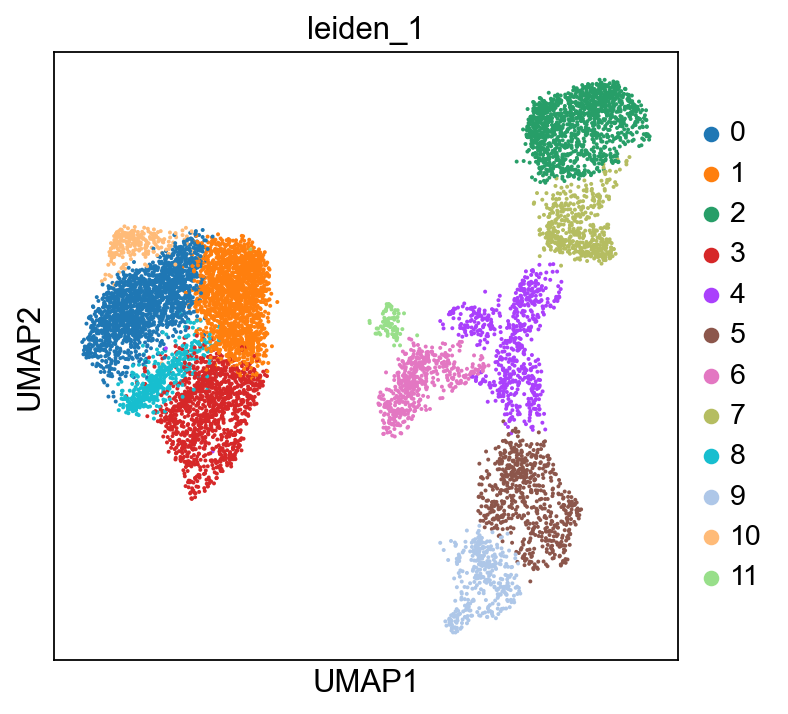

In [17]:
sc.pl.umap(adata, color="leiden_1")

In [18]:
sc.tl.leiden(adata, resolution=2, key_added='leiden_2')

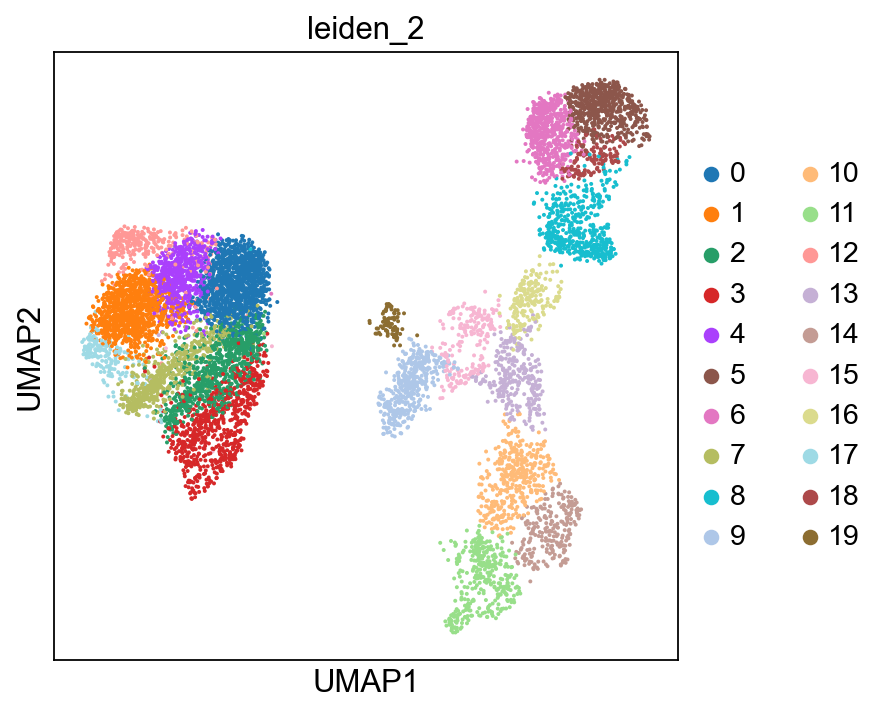

In [19]:
sc.pl.umap(adata, color="leiden_2")

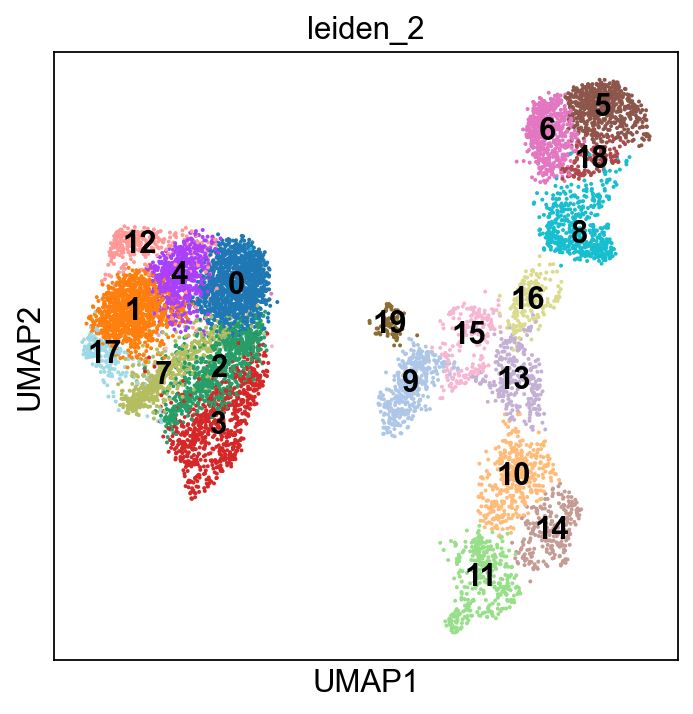

In [20]:
sc.pl.umap(adata, color='leiden_2', legend_loc="on data")

In [21]:
B_plasma_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in B_plasma_cts
}

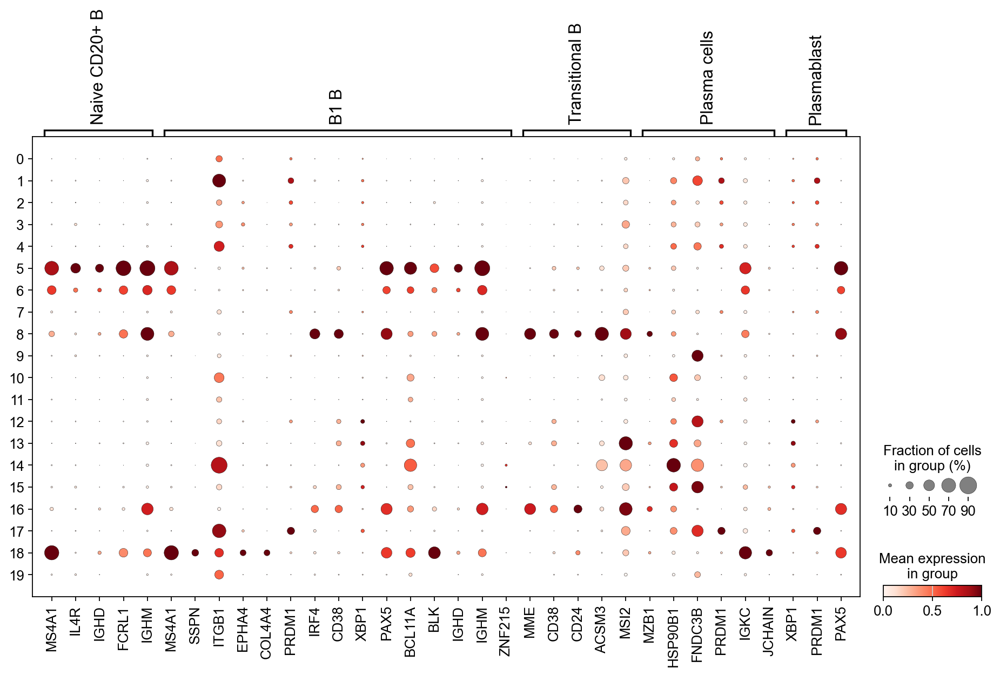

In [22]:
sc.pl.dotplot(
    adata,
    groupby='leiden_2',
    var_names=B_plasma_markers,
    standard_scale="var"
)

B1 B 세포에 대한 주석(annotation) 직업이 어렵다는 것을 알 수 있습니다.

모든 B1 B 마커를 발현하는 클러스터가 없고, 여러 클러스터가 일부 마커를 발현하기 때문입니다.

한 데이터셋에서 효과적인 마커가 다른 데이터셋에서는 효과적이지 않은 경우가 종종 있습니다.

이는 시퀀싱 깊이의 차이 때문일 수도 있지만, 데이터셋이나 샘플 간의 다른 변이 원인일 수도 있습니다.

In [23]:
cl_annotation = {
    "4": "Naive CD20+ B",
    "6": "Naive CD20+ B",
    "8": "Transitional B",
    "18": "B1 B", # note that IGHD and IGHM are negative markers, in this case more lowly expressed than in the other B cell clusters
}

In [24]:
adata.obs["manual_celltype_annotation"] = adata.obs.leiden_2.map(cl_annotation)

... storing 'manual_celltype_annotation' as categorical


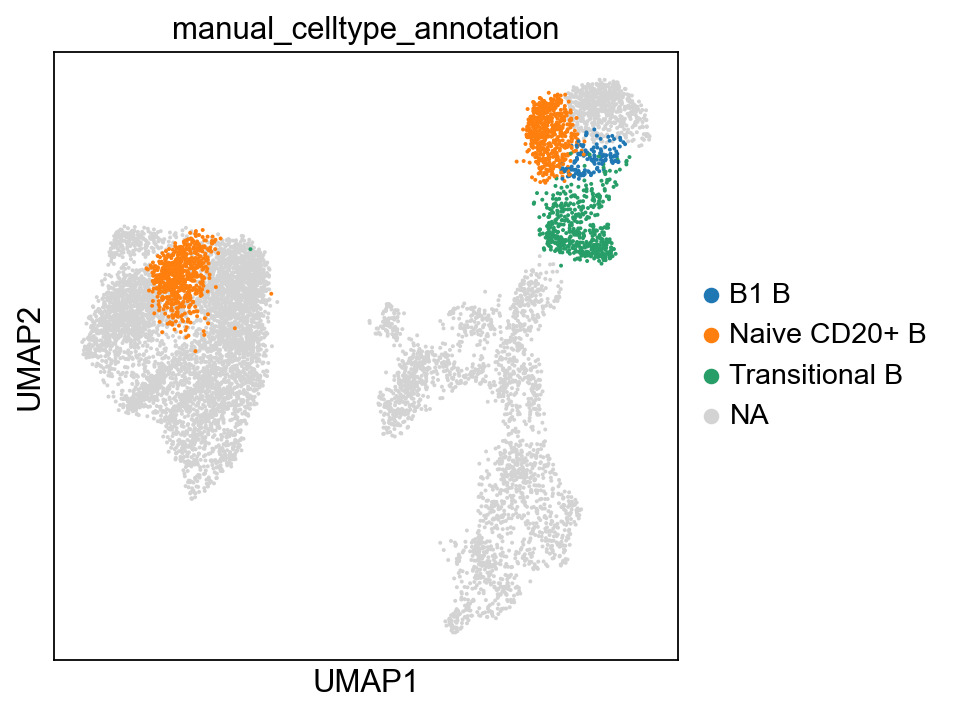

In [25]:
sc.pl.umap(adata, color=["manual_celltype_annotation"])

### 클러스터 차등 발현 유전자에서 클러스터 주석으로

반대로, 클러스터당 마커 유전자를 계산한 후, 해당 마커 유전자를 세포 유형 및/또는 상태와 같은 알려진 새움ㄹ학적 특성과 연결할 수 있는지 확인할 수 있습니다.

클러스터의 마커 유전자 계산에는 wilcoxon 순위합 검정과 같은 간단한 방법이 가장 좋은 성능을 보이는것으로 알려져 있습니다.

중요한 점은 클러스터 정의가 이러한 통계적 검정에 사용된 것과 동일한 데이터를 기반으로 하기 때문에, 이러한 검정의 p-값이 여기에서 설명한 바와 같이 부풀려진다는 것입니다.

우리 데이터의 나머지 세포와 비교하여 각 클러스터의 차등적으로 발현되는 유전자를 계산해 보겠습니다.

In [26]:
sc.tl.rank_genes_groups(
    adata, groupby='leiden_2', method="wilcoxon", key_added="dea_leiden_2"
)

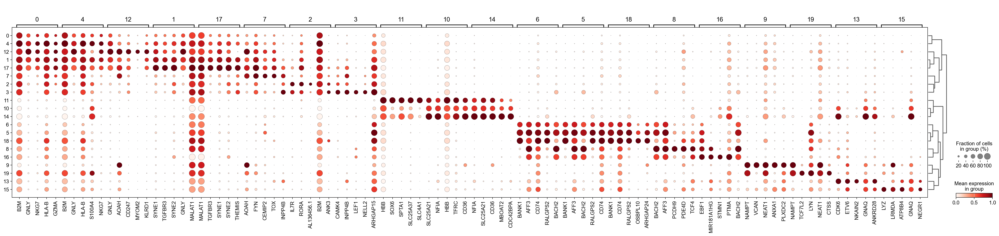

In [27]:
sc.pl.rank_genes_groups_dotplot(
    adata, groupby="leiden_2", standard_scale='var', n_genes=5, key="dea_leiden_2"
)

위에서 볼 수 있듯이, 차등 발현 유전자 중 상당수는 여러 클러스터에서 고도로 발현됩니다.

차등 발현 유전자를 필터링하여 클러스터별로 특이적인 차등 발현 유전자를 선택할 수 있습니다.

In [28]:
sc.tl.filter_rank_genes_groups(
    adata,
    min_in_group_fraction=0.2,
    max_out_group_fraction=0.2,
    key="dea_leiden_2",
    key_added="dea_leiden_2_filtered"
)

필터링된 유전자를 시각화

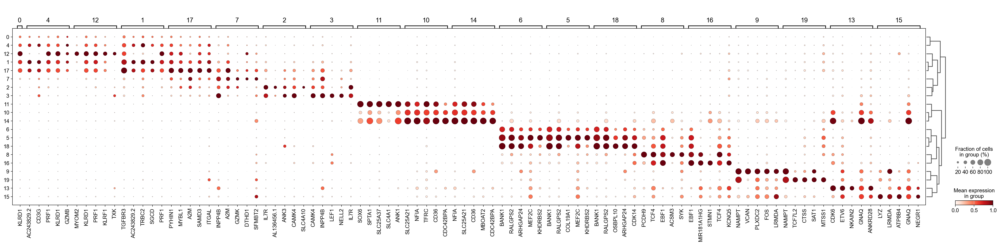

In [29]:
sc.pl.rank_genes_groups_dotplot(
    adata,
    groupby="leiden_2",
    standard_scale="var",
    n_genes=5,
    key="dea_leiden_2_filtered"
)

CDk6, ETV6, NKAIN2, GNAQ를 포함하여 비교적 고유한 마커들을 가지고 있는 것으로 보이는 클러스터 12를 살펴보았습니다.

구글링 결과, NKAIN2와 ETV6는 조혈줄기세포 마커인 것으로 나타났습니다.

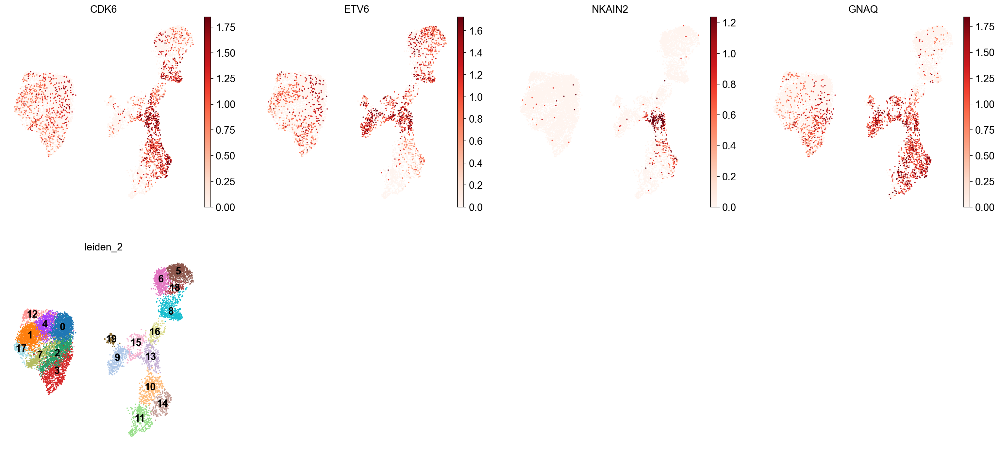

In [30]:
sc.pl.umap(
    adata,
    color=["CDK6", "ETV6", "NKAIN2", "GNAQ", "leiden_2"],
    vmax="p99",
    legend_loc="on data",
    frameon=False,
    cmap="Reds"
)

그러나 거핵구/적혈구 전구세포에 대한 알려진 마커 ("MK/E prog")를 살펴보면 클러스터 12의 일부가 해당 세포 유형에 속하는 것으로 보입니다.

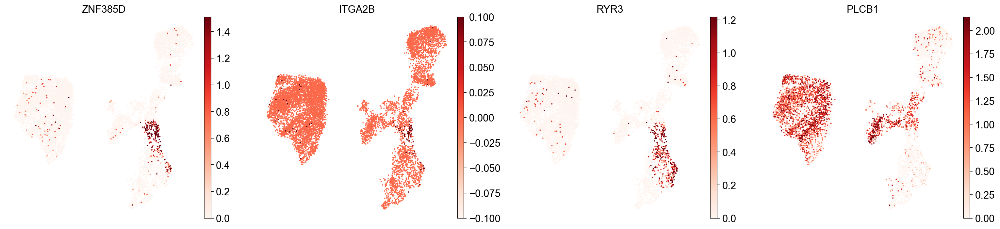

In [31]:
sc.pl.umap(
    adata,
    color=[
        "ZNF385D",
        "ITGA2B",
        "RYR3",
        "PLCB1",
    ],
    vmax="p99",
    legend_loc="on data",
    frameon=False,
    cmap="Reds"
)

marker 기반 주석이 얼마나 복잡한지를 보여줍니다.

선택한 클러스터 해상도, 보유한 마커 세트의 견고성과 고유성, 데이터에서 예상되는 세포 유형에 대한 지식에 따라 민감하게 반응합니다.

이러한 이유로 이 분야는 수동 클러스터 어노테이션에서 벗어나 자동화된 어노테이션 알고리즘으로 전환하는 데 노력하고 있습니다.

이 튜토리얼의 나머지 부분에서는 이러한 옵션에 중점을 둘 것입니다.

계속하기 전에 주석 정보의 마지막 부분을 adata에 저장합니다.

In [32]:
cl_annotation["12"] = "HSCs + NK/E prog (?)"

In [33]:
adata.obs["manual_celltype_annotation"] = adata.obs.leiden_2.map(cl_annotation)

### 자동 주석

11.5.1. 일반적인 설명

나머지 논의된 방법은 수동이 아닌 자동화된 데이터 주석을 위한 방법입니다.

위에서 보여준 방법과 달리 이러한 각 방법을 사용하면 자동화된 방식으로 데이터에 주석을 달 수 있습니다.

이러한 방법은 서로 다른 원칙에 기반하며, 때로는 사전 정의된 마커 세트가 필요하고, 때로는 기존 전체 scRNA-seq 데이터 세트에서 학습합니다.

아래에서 설명하는 것처럼 결과 주석의 품질이 다를 수 있습니다. 따라서 이러한 방법을 주석 프로세스의 종점이 아닌 시작점으로 간주하는 것이 중요합니다.

자동화된 주석 방법에 대한 자세한 논의 여러 리뷰도 참조 

(https://www.sc-best-practices.org/cellular_structure/annotation.html#id166)

(https://www.sc-best-practices.org/cellular_structure/annotation.html#id167)


앞서 말씀드렸듯이, 자동 생성된 주석의 품질은 다양할 수 있습니다. 더 구체적으로, 주석의 품질은 다음 요인에 따라 달라진다.

1. 서낵한 분류기 유형: 이전 

In [34]:
adata_celltypist = adata.copy()

adata_celltypist.X = adata.layers["counts"]
sc.pp.normalize_total(
    adata_celltypist, target_sum=10**4
)
sc.pp.log1p(adata_celltypist) # log-transform

# make .X dense instead of sparse, for compatibility with celltypist
adata_celltypist.X = adata_celltypist.X.toarray()

In [35]:
# 이제 면역 세포에 대한 셀타입 모델을 다운로드해 보겠습니다.

models.download_models(
    force_update=True, model=["Immune_All_Low.pkl","Immune_All_High.pkl"]
)

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 58
📂 Storing models in /Users/yanghyejeong/.celltypist/data/models
💾 Total models to download: 2
💾 Downloading model [1/2]: Immune_All_Low.pkl
💾 Downloading model [2/2]: Immune_All_High.pkl


**Immune_All_Low** 두 모델을 모두 시도해 보겠습니다.

**Immune_All_High** 이 모델들은 면역 세포 유형에 대해 주석을 달 때 주석 수준을 낮음(더 세밀하게) 및 높음 (더 거칠게)으로 표시함.

In [36]:
model_low = models.Model.load(model="Immune_All_Low.pkl")
model_high = models.Model.load(model="Immune_All_High.pkl")

이들 각각에 대해 골수 세포 유형이 포함되어 있는지 확인하기 위해 어떤 세포 유형이 포함되어 있는지 확인할 수 있습니다.

In [37]:
model_high.cell_types

array(['B cells', 'B-cell lineage', 'Cycling cells', 'DC', 'DC precursor',
       'Double-negative thymocytes', 'Double-positive thymocytes', 'ETP',
       'Early MK', 'Endothelial cells', 'Epithelial cells',
       'Erythrocytes', 'Erythroid', 'Fibroblasts', 'Granulocytes',
       'HSC/MPP', 'ILC', 'ILC precursor', 'MNP', 'Macrophages',
       'Mast cells', 'Megakaryocyte precursor',
       'Megakaryocytes/platelets', 'Mono-mac', 'Monocyte precursor',
       'Monocytes', 'Myelocytes', 'Plasma cells', 'Promyelocytes',
       'T cells', 'pDC', 'pDC precursor'], dtype=object)

In [38]:
model_low.cell_types

array(['Age-associated B cells', 'Alveolar macrophages', 'B cells',
       'CD16+ NK cells', 'CD16- NK cells', 'CD8a/a', 'CD8a/b(entry)',
       'CMP', 'CRTAM+ gamma-delta T cells', 'Classical monocytes',
       'Cycling B cells', 'Cycling DCs', 'Cycling NK cells',
       'Cycling T cells', 'Cycling gamma-delta T cells',
       'Cycling monocytes', 'DC', 'DC precursor', 'DC1', 'DC2', 'DC3',
       'Double-negative thymocytes', 'Double-positive thymocytes', 'ELP',
       'ETP', 'Early MK', 'Early erythroid', 'Early lymphoid/T lymphoid',
       'Endothelial cells', 'Epithelial cells', 'Erythrocytes',
       'Erythrophagocytic macrophages', 'Fibroblasts',
       'Follicular B cells', 'Follicular helper T cells', 'GMP',
       'Germinal center B cells', 'Granulocytes', 'HSC/MPP',
       'Hofbauer cells', 'ILC', 'ILC precursor', 'ILC1', 'ILC2', 'ILC3',
       'Intermediate macrophages', 'Intestinal macrophages',
       'Kidney-resident macrophages', 'Kupffer cells',
       'Large pre-B cell

In [39]:
predictions_high = celltypist.annotate(
    adata_celltypist,
    model=model_high,
    majority_voting=True
)

🔬 Input data has 9370 cells and 31208 genes
🔗 Matching reference genes in the model
🧬 6047 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!


In [40]:
predictions_high_adata =  predictions_high.to_adata()

...그리고 결과를 원래 AnnData 객체에 복사합니다.

In [41]:
adata.obs["celltypist_cell_label_coarse"] = predictions_high_adata.obs.loc[
    adata.obs.index, "majority_voting"
]
adata.obs["celltypist_conf_score_coarse"] = predictions_high_adata.obs.loc[
    adata.obs.index, "conf_score"
]

이제 더 세부적인 주석에도 동일하게 적용됩니다.

In [42]:
predictions_low = celltypist.annotate(
    adata_celltypist, model=model_low, majority_voting=True
)

🔬 Input data has 9370 cells and 31208 genes
🔗 Matching reference genes in the model
🧬 6047 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!


In [43]:
predictions_low_adata = predictions_low.to_adata()

In [44]:
adata.obs["celltypist_cell_label_fine"] = predictions_low_adata.obs.loc[
    adata.obs.index, "majority_voting"
]
adata.obs["celltypist_conf_score_fine"] = predictions_low_adata.obs.loc[
    adata.obs.index, "conf_score"
]

... storing 'manual_celltype_annotation' as categorical


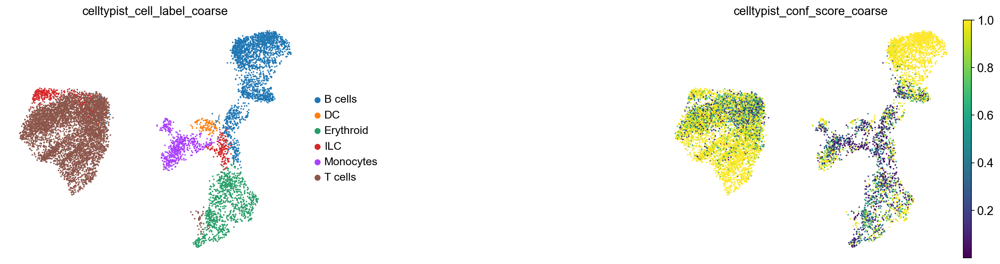

In [45]:
sc.pl.umap(
    adata,
    color=["celltypist_cell_label_coarse", "celltypist_conf_score_coarse"],
    frameon=False,
    sort_order=False,
    wspace=1,
)

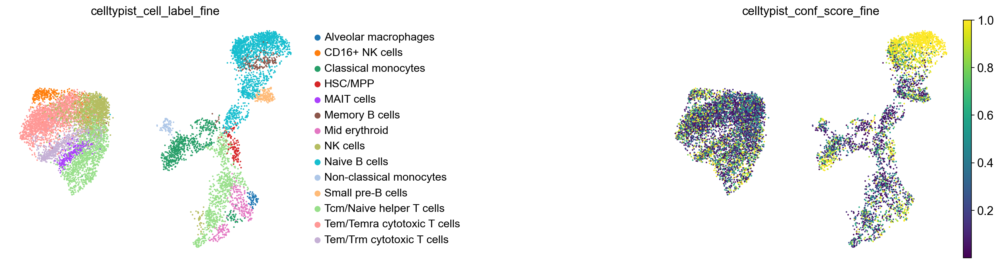

In [47]:
sc.pl.umap(
    adata,
    color=["celltypist_cell_label_fine","celltypist_conf_score_fine"],
    frameon=False,
    sort_order=False,
    wspace=1,
)

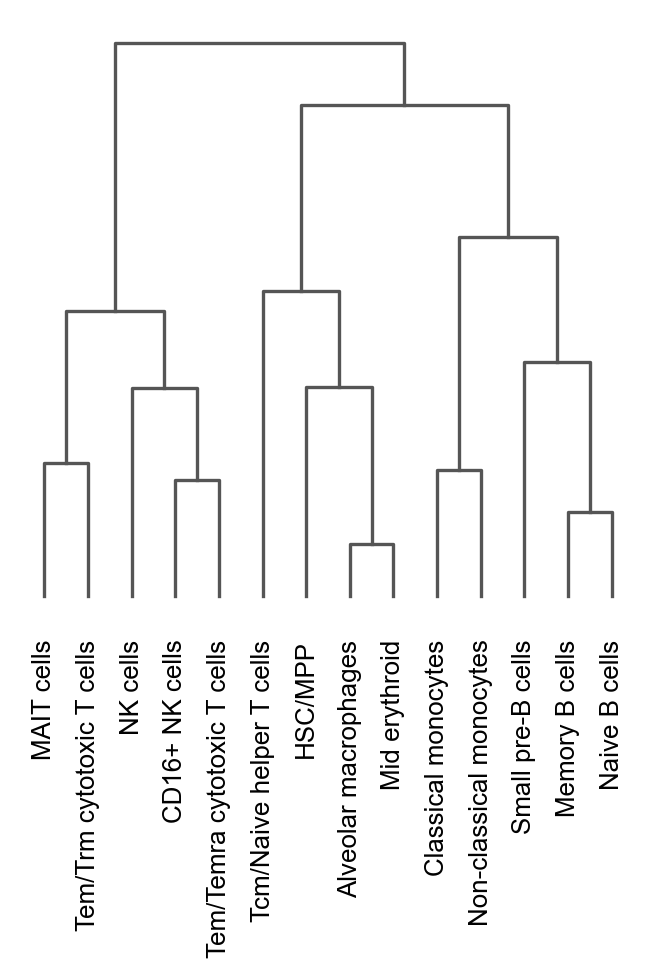

<Axes: >

In [48]:
sc.pl.dendrogram(adata, groupby="celltypist_cell_label_fine")

이 계통도는 세포 유형 관계에 대한 기존 지식 (ex:B cell가 주로 모여 있음)을 부분적으로 반영하지만, 예상치 못한 패턴도 관찰됩니다.

Tcm/Naive 헬퍼 T 세포는 다른 T 세포가 아닌 적혈구 세포 및 대식세포와 함께 모여 있습니다.

이는 위험 신호입니다! Tcm/Naive 헬퍼 T세포 주석이 잘못되었을 가능성이 있습니다.

앞서 작성한 수동 주석을 살펴보겠습니다.

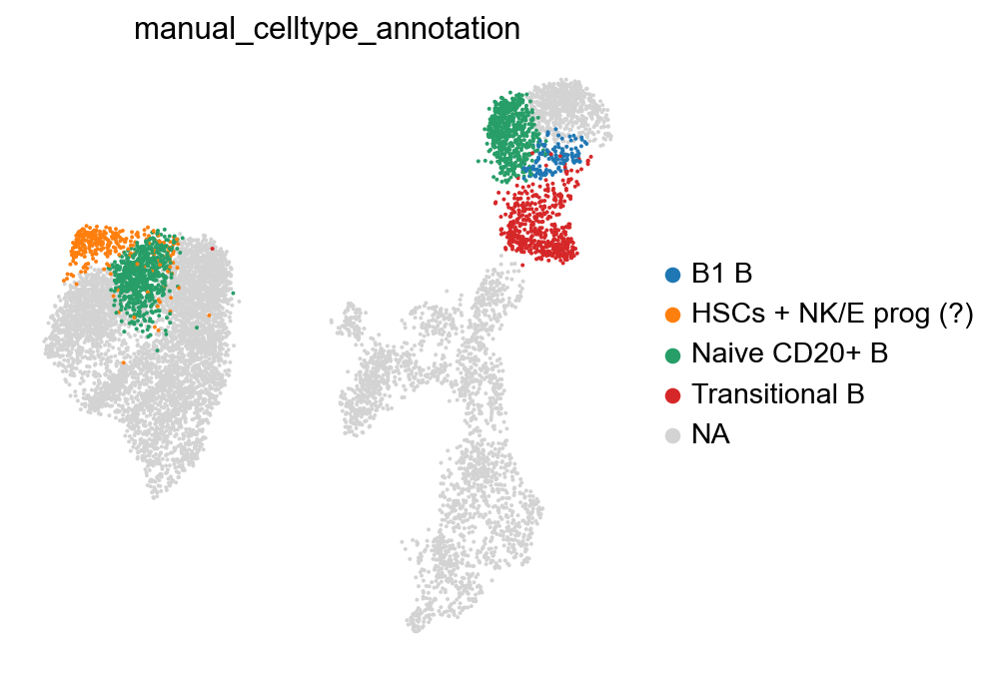

In [49]:
sc.pl.umap(
    adata,
    color=["manual_celltype_annotation"],
    frameon=False,
)

우리의 순수 B 세포 주석이 자동 순수 B 세포 주석의 일부와 잘 일치하는 것을 볼 수 있습니다.

마찬가지로, 우리가 이행 B 세포라고 부르는 것의 일부는 주석에서 "소형 전 B 세포"라고 불리고, 우리의 B1 B 세포는 기억 B 세포와 일치하는데, 이는 고무적입니다!

하지만 HSC + MK/E prog cluster는 미세 주석에서 T 세포와 HSC/다능성 전구세포의 혼합으로 주석 처리되어 있어, 이러한 주석들이 부분적으로 모순되는 것을 알 수 있습니다.

두 주석의 신뢰도 점수를 살펴보면, 더 많은 세포에 대한 주석 처리가 상대적으로 낮은 신뢰도로 이루어졌음을 알 수 있습니다.

이는 신중한 검증과 수작업 검토 없이는 이러한 주석을 복사할 수 없음을 시사합니다 !

여기에서 클러스터 12의 세부 셀타이피스트 라벨을 참조하세요

In [50]:
pd.crosstab(adata.obs.leiden_2, adata.obs.celltypist_cell_label_fine).loc[
    "12",:
].sort_values(ascending=False)

celltypist_cell_label_fine
CD16+ NK cells                 239
NK cells                        28
Tem/Temra cytotoxic T cells     27
Tem/Trm cytotoxic T cells        2
Tcm/Naive helper T cells         1
Alveolar macrophages             0
Classical monocytes              0
HSC/MPP                          0
MAIT cells                       0
Memory B cells                   0
Mid erythroid                    0
Naive B cells                    0
Non-classical monocytes          0
Small pre-B cells                0
Name: 12, dtype: int64

좀 더 거친 세포 타이피스트 라벨에서는 다른 패턴을 관찰할 수 있습니다.

클러스터 12는 대부분 B 세포나 거핵구 전구체로 주석이 달려 있는데, 이는 다시 한번 우리의 주석과 부분적으로만 일치합니다.

In [51]:
pd.crosstab(adata.obs.leiden_2, adata.obs.celltypist_cell_label_coarse).loc[
    "12", :
].sort_values(ascending=False)

celltypist_cell_label_coarse
ILC          251
T cells       46
B cells        0
DC             0
Erythroid      0
Monocytes      0
Name: 12, dtype: int64

따라서 이 자동 주석은 수동 주석과 일부만 일치하며, 자체적인 거친 레이블과 미세 레이블 간에도 모순되는 것을 알 수 있습니다. 이러한 실패의 가능한 원인은 위에서 논의되었습니다.

이는 자동 주석 알고리즘을 신중하게 사용해야 하며, 최종 주석이 아닌 데이터 주석 작성의 시작점으로 간주해야 함을 강조합니다. 궁극적으로, 알려진 마커 유전자의 발현은 여전히 ​​세포 유형 주석에 대한 가장 널리 받아들여지는 지지체입니다.

이를 강조하기 위해 적혈구 계통의 마커인 헤모글로불린 B를 살펴보겠습니다. "Tcm/Naive helper T"로 주석이 달린 세포(위의 계통도를 기준으로 잘못 주석이 달린 것으로 표시됨)는 적혈구 계통에 속할 가능성이 가장 높습니다!

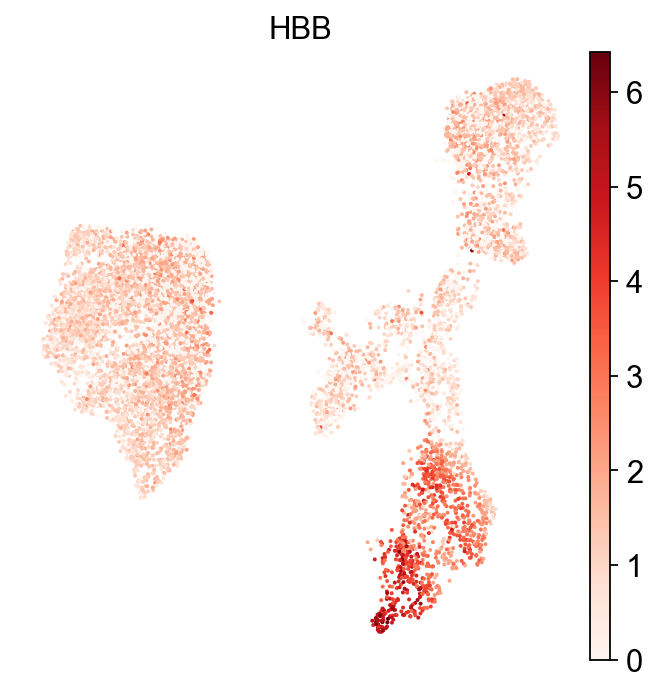

In [52]:
sc.pl.umap(adata, color="HBB", cmap="Reds", frameon=False, sort_order=False)

In [53]:
adata_to_map = adata.copy()
for layer in list (adata_to_map.layers.keys()):
    if layer != "counts":
        del adata_to_map.layers[layer]
adata_to_map.X = adata_to_map.layers["counts"]

더욱이, 참조 모델을 학습하는 데 사용된 것과 동일한 입력 특징(예: 유전자)을 사용하고, 

이러한 특징들을 동일한 순서로 배치하는 것이 중요합니다. 참조 모델의 특징 정보는 모델과 함께 저장됩니다. 특징 테이블을 로드해 보겠습니다.

In [54]:
reference_model_features = pd.read_csv(
    "https://figshare.com/ndownloader/files/41436645", index_col=0
)

이 테이블에는 유전자 이름과 유전자 ID가 모두 있습니다. 유전자 ID는 일반적으로 게놈 주석 버전에 따라 변경 가능성이 낮으므로,

이를 사용하여 데이터의 하위 집합을 만들 것입니다. 따라서 데이터와 참조 모델 피쳐 모두의 행 이름으로 설정합니다

**gene_ids** 중요한 것은 나중에 사용할 수 있도록 유전자 이름도 저장해야 한다는 것입니다.

유전자ID 보다 이해하기가 훨씬 쉽습니다.

In [55]:
adata_to_map.var["gene_names"] = adata_to_map.var.index
adata_to_map.var.set_index("gene_ids", inplace=True)

In [56]:
reference_model_features["gene_names"] = reference_model_features.index
reference_model_features.set_index("gene_ids", inplace=True)

In [57]:
print("Total number of genes needed for mapping:", reference_model_features.shape[0])

Total number of genes needed for mapping: 4000


In [58]:
print(
    "Number of genes found in query dataset: ",
    adata_to_map.var.index.isin(reference_model_features.index).sum(),
)

Number of genes found in query dataset:  3998


몇 개의 유전자가 누락되었습니다. 

이 유전자들이 데이터에서 검출되지 않은 것 같으므로, 수동으로 추가하고 개수를 0으로 설정합니다.

 누락된 유전자에 대해 0 값만 갖는 AnnData 객체를 만들어 보겠습니다(매핑에 사용될 원시 개수 레이어 포함). 나중에 이 객체를 자체 AnnData 객체에 연결합니다.



In [59]:
missing_genes = [
    gene_id
    for gene_id in reference_model_features.index
    if gene_id not in adata_to_map.var.index
]

In [60]:
missing_gene_adata = sc.AnnData(
    X=csr_matrix(np.zeros(shape=(adata.n_obs, len(missing_genes))), dtype="float32"),
    obs=adata.obs.iloc[:, :1],
    var=reference_model_features.loc[missing_genes, :],
)
missing_gene_adata.layers["counts"] = missing_gene_adata.X

원래 데이터 집합을 누락된 유전자 데이터 집합에 연결합니다. 

이 연결을 오류 없이 수행할 수 있도록, varm에서 PCA 행렬을 제거합니다.

In [61]:
if "PCs" in adata_to_map.varm.keys():
    del adata_to_map.varm["PCs"]

In [62]:
adata_to_map_augmented = sc.concat(
    [adata_to_map, missing_gene_adata],
    axis=1,
    join="outer",
    index_unique=None,
    merge="unique",
)

In [63]:
adata_to_map_augmented = adata_to_map_augmented[
    :, reference_model_features.index
].copy()

우리의 adata 유전자 이름이 요구되는 유전자 순서와 정확히 일치하는지 확인하세요:

In [64]:
(adata_to_map_augmented.var.index == reference_model_features.index).all()

True

이제 쉽게 해석할 수 있도록 유전자 인덱스를 유전자 이름으로 다시 설정할 수 있습니다.


In [66]:
adata_to_map_augmented.var["gene_ids"] = adata_to_map_augmented.var.index
adata_to_map_augmented.var.set_index("gene_names", inplace=True)

In [67]:
adata_to_map_augmented.obs.batch.unique()

['12']
Categories (1, object): ['12']

In [71]:
# loading model.pt from figshare
if not Path("./reference_model").exists():
    Path("./reference_model").mkdir()
elif not Path("./reference_model/model.pt").exists():
    urllib.request.urlretrieve(
        "https://figshare.com/ndownloader/files/41436648",
        filename="reference_model/model.pt",
    )

In [76]:
import torch
_real_torch_load = torch.load
def patched_torch_load(*args, **kwargs):
    kwargs["weights_only"] = False
    return _real_torch_load(*args, **kwargs)
torch.load = patched_torch_load

import scarches as sca
scarches_model = sca.models.SCVI.load_query_data(
    adata=adata_to_map_augmented,
    reference_model="./reference_model",
    freeze_dropout=True,
)

INFO     File ./reference_model/model.pt already downloaded                                                        


Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: dlopen(libtpu.so, 0x0001): tried: 'libtpu.so' (no such file), '/System/Volumes/Preboot/Cryptexes/OSlibtpu.so' (no such file), '/Users/yanghyejeong/miniforge3/envs/py_annotation/bin/../lib/libtpu.so' (no such file), '/usr/lib/libtpu.so' (no such file, not in dyld cache), 'libtpu.so' (no such file), '/usr/local/lib/libtpu.so' (no such file), '/usr/lib/libtpu.so' (no such file, not in dyld cache)


In [77]:
scarches_model.train(max_epochs=500, plan_kwargs={"weight_decay": 0.0})

INFO: GPU available: True (mps), used: False
GPU available: True (mps), used: False
INFO: TPU available: False, using: 0 TPU cores
TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
HPU available: False, using: 0 HPUs


Epoch 500/500: 100%|██████████| 500/500 [31:42<00:00,  3.10s/it, v_num=1, train_loss_step=1.02e+3, train_loss_epoch=1.04e+3]  

INFO: `Trainer.fit` stopped: `max_epochs=500` reached.
`Trainer.fit` stopped: `max_epochs=500` reached.


Epoch 500/500: 100%|██████████| 500/500 [31:42<00:00,  3.80s/it, v_num=1, train_loss_step=1.02e+3, train_loss_epoch=1.04e+3]


In [78]:
adata.obsm["X_scVI"] = scarches_model.get_latent_representation()

In [79]:
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.umap(adata)

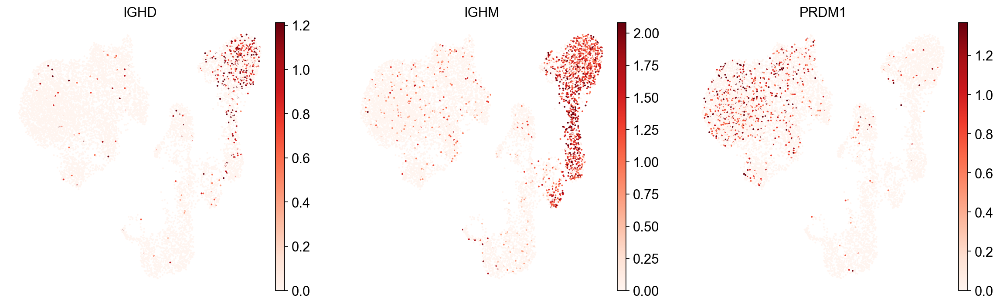

In [80]:
sc.pl.umap(
    adata,
    color=["IGHD", "IGHM", "PRDM1"],
    vmin=0,
    vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
    sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
    frameon=False,
    cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
)

In [81]:
ref_emb = sc.read(
    filename="reference_embedding.h5ad",
    backup_url="https://figshare.com/ndownloader/files/41376264"
)

100%|██████████| 37.0M/37.0M [01:32<00:00, 422kB/s] 


In [82]:
ref_emb.obs["reference_or_query"] = "reference"

In [83]:
ref_emb

AnnData object with n_obs × n_vars = 86332 × 10
    obs: 'donor', 'batch', 'site', 'cell_type', 'reference_or_query'
    uns: 'neighbors', 'umap'
    obsm: 'X_umap'
    obsp: 'connectivities', 'distances'

10개의 차원(.X)만 있으며, 이는 참조 셀의 잠재 공간 임베딩을 나타낸다.

자체 데이터에 대해 계산한 쿼리 임베딩 또한 10개의 차원을 가집니다.

참조 셀과 쿼리 셀의 10개 차원은 동일하며 결합할 수 있습니다.

또한 에는 셀 유형 레이블이 있습니다.

**.obs['cell_type']** 이 레이블을 사용하여 자체 데이터에 주석을

In [85]:
adata_emb = sc.AnnData(X=adata.obsm["X_scVI"], obs=adata.obs)

In [86]:
adata_emb.obs["reference_or_query"] = "query"

In [87]:
emb_ref_query = sc.concat(
    [ref_emb, adata_emb],
    axis=0,
    join="outer",
    index_unique=None,
    merge="unique",
)

umap을 사용하여 조인트 임베딩을 시각화하겠습니다.

In [88]:
sc.pp.neighbors(emb_ref_query)
sc.tl.umap(emb_ref_query)

... storing 'reference_or_query' as categorical


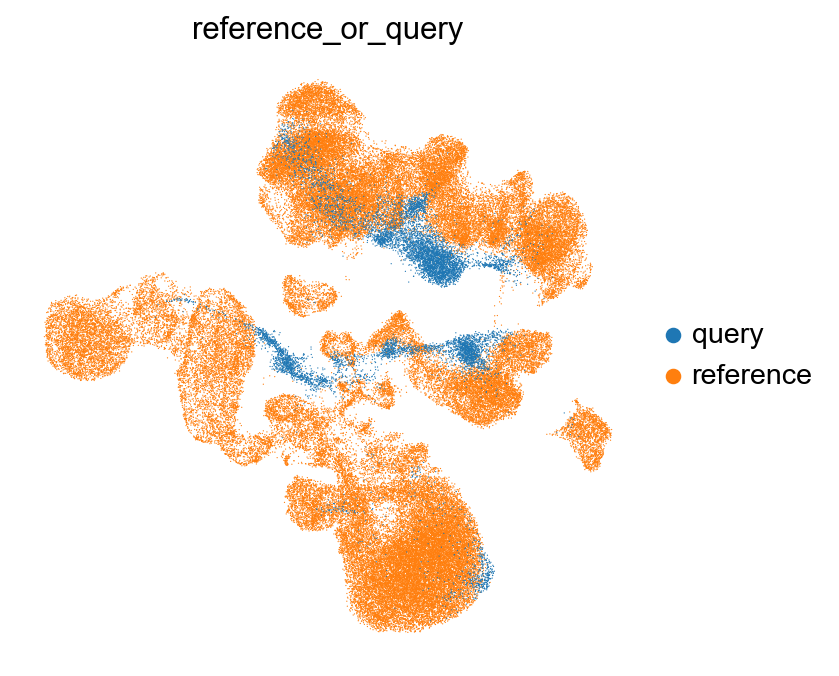

In [89]:
sc.pl.umap(
    emb_ref_query,
    color=["reference_or_query"],
    sort_order=False,
    frameon=False,
)

이 UMAP에서 쿼리와 참조가 부분적으로 혼합된 것은 좋은 신호입니다.

매핑이 완전히 실패하는 경우, UMAP에서 쿼리와 참조가 완전히 분리된 것을 종종 볼 수 있습니다.

이제 참조에서 셀 유형 주석을 살펴보겠습니다. 쿼리의 모든 셀은 아직 주석이 없으므로 NA로 설정되어 검은색으로 표시됩니다.

범례를 잘 읽을 수 있도록 이 그림을 조금 더 크게 만들어 보겠습니다.

In [90]:
sc.set_figure_params(figsize=(8,8))

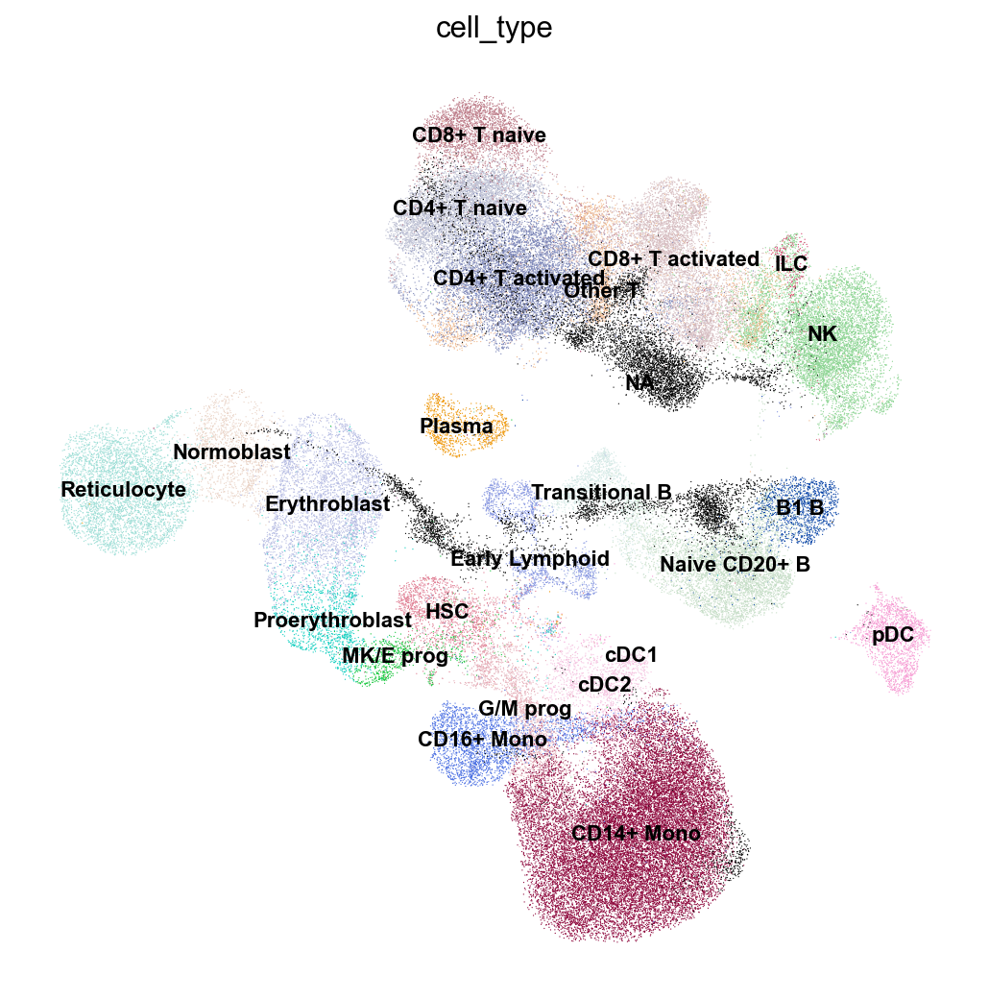

In [91]:
sc.pl.umap(
    emb_ref_query,
    color=["cell_type"],
    sort_order=False,
    frameon=False,
    legend_loc="on data",
    legend_fontsize=10,
    na_color="black",
)

UMAP에서 이미 알 수 있듯이, 각 셀 (검은색)의 셀 유형은 참조 셀에서 어떤 셀 유형이 주변을 둘러싸고 있는지 확인하여 추측할 수 있습니다.

이는 최근접 이웃 그래프 기반 레이블 전송 방식이 수행하는 방식과 정확히 같습니다.

각 쿼리 셀에 대해 인접 참조 셀 중 가장 흔한 셀 유혀이 무엇인지 확인합니다.

단일 셀 유형에서 참조 셀이 차지하는 비율이 높을수록 레이블 전송의 신뢰도가 높아집니다.

KNN 기반 레이블 전송을 수행해 보겠습니다.

먼저 라벨 전송 모델을 설정

In [92]:
knn_transformer = sca.utils.knn.weighted_knn_trainer(
    train_adata = ref_emb,
    train_adata_emb = "X", # location of our joint embedding
    n_neighbors=15,
)

Weighted KNN with n_neighbors = 15 ... 

In [93]:
labels, uncert = sca.utils.knn.weighted_knn_transfer(
    query_adata=adata_emb,
    query_adata_emb="X",  # location of our embedding, query_adata.X in this case
    label_keys="cell_type",  # (start of) obs column name(s) for which to transfer labels
    knn_model=knn_transformer,
    ref_adata_obs=ref_emb.obs,
)

finished!


결과를 우리의 adata에 저장합니다.

In [94]:
adata_emb.obs["transf_cell_type"] = labels.loc[adata_emb.obs.index, "cell_type"]
adata_emb.obs["transf_cell_type_unc"] = uncert.loc[adata_emb.obs.index, "cell_type"]

결과를 UMAP과 유전자 개수도 포함하고 있는 쿼리 adata 객체로 전송하여 이를 모두 함께 시각화할 수 있도록 합시다.

In [95]:
adata.obs.loc[adata_emb.obs.index, "transf_cell_type"] = adata_emb.obs[
    "transf_cell_type"
]
adata.obs.loc[adata_emb.obs.index, "transf_cell_type_unc"] = adata_emb.obs[
    "transf_cell_type_unc"
]

이제 우리는 이전에 계산한 우리 데이터의 UMAP에서 전ㄴ송된 레입르을 시각화할 수 있습니다.

그림의 크기를 다시 작게 설정해 보겠습니다.

In [96]:
sc.set_figure_params(figsize=(5,5))

... storing 'transf_cell_type' as categorical


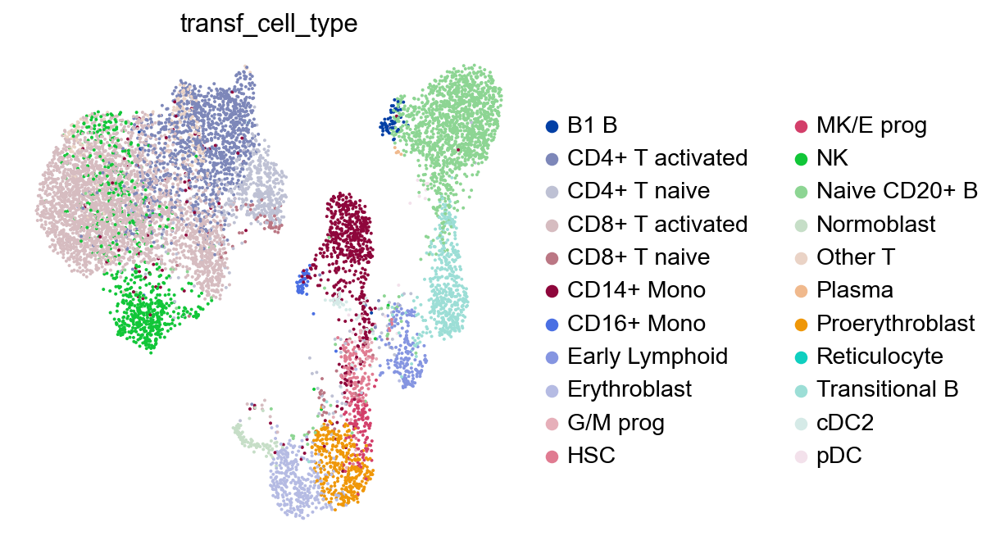

In [97]:
sc.pl.umap(adata, color="transf_cell_type", frameon=False)

각 쿼리 셀의 이웃을 기반으로 해당 셀이 속하는 셀 유형을 추측할 수 있을 뿐만 아니라, 해당 레이블의 확실성 척도를 생성할 수 있습니다. 

한 셀에 여러 다른 셀 유형의 이웃이 있는 경우, 추측은 매우 불확실해집니다. 

이는 전달된 레이블을 얼마나 "신뢰"할 수 있는지 평가하는 데 중요합니다! 불확실성 점수를 시각화해 보겠습니다.

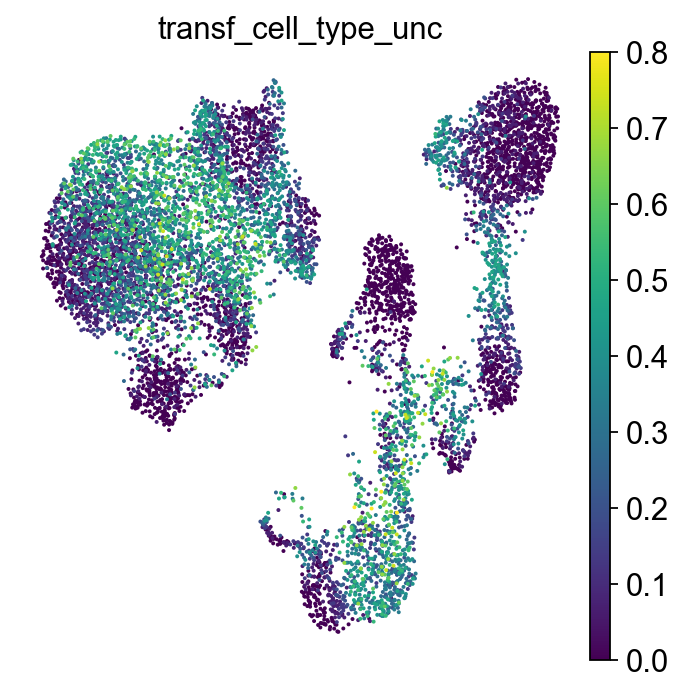

In [98]:
sc.pl.umap(adata, color="transf_cell_type_unc", frameon=False)

각 세포 유형 레이블에 대해 레이블 전달 불확실성 수준이 얼마나 높은지 확인해 보겠습니다. 

이를 통해 어떤 주석이 더 논쟁의 여지가 있거나 수동 검사가 더 필요한지 파악할 수 있습니다.

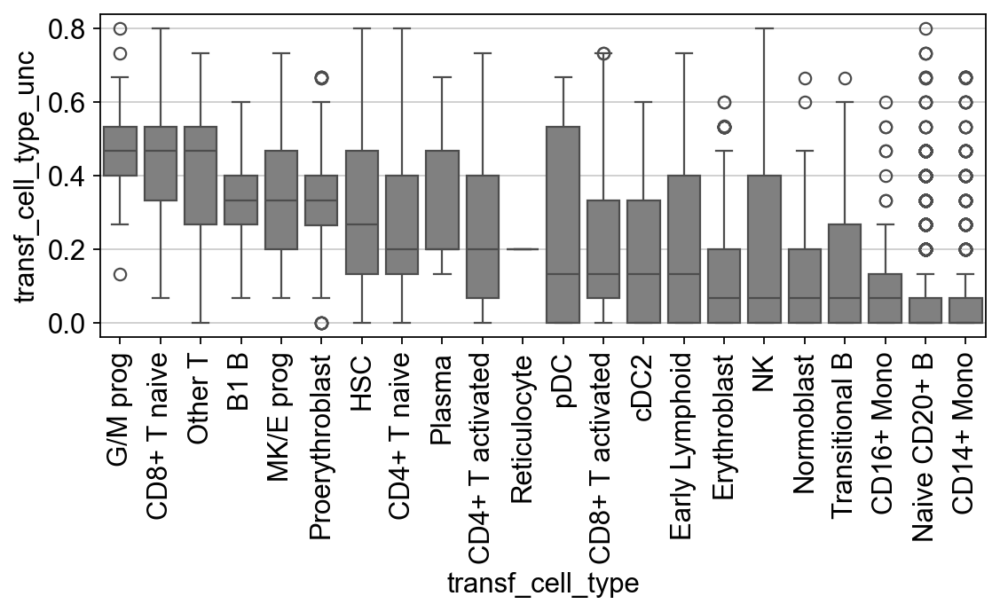

In [99]:
fig, ax = plt.subplots(figsize=(8, 3))
ct_order = (
    adata.obs.groupby("transf_cell_type")
    .agg({"transf_cell_type_unc": "median"})
    .sort_values(by="transf_cell_type_unc", ascending=False)
)
sns.boxplot(
    adata.obs,
    x="transf_cell_type",
    y="transf_cell_type_unc",
    color="grey",
    ax=ax,
    order=ct_order.index,
)
ax.tick_params(rotation=90, axis="x")

예를 들어 전구 세포는 다른 세포 유형보다 구별하기 어려운 경우가 많습니다. 

주석에 있는 다소 불특정한 범주인 "기타 T 세포"도 마찬가지입니다. 

가장 오른쪽에는 전사적으로 상당히 구별되는 것으로 알려진 세포 유형인 pDC가 있는데, 따라서 인식하고 분류하기가 더 쉽습니다.

이러한 불확실성 정보를 전송된 레이블에 통합하려면 불확실성 점수가 0.2 이상인 셀을 "알 수 없음"으로 설정할 수 있습니다.



In [100]:
adata.obs["transf_cell_type_certain"] = adata.obs.transf_cell_type.tolist()
adata.obs.loc[adata.obs.transf_cell_type_unc > 0.2, "transf_cell_type_certain"] = (
    "Unknown"
)

필터링 후 주석이 어떻게 보이는지 살펴보겠습니다. 범례의 '알 수 없음' 색상과 UMAP에 주목하세요.

... storing 'transf_cell_type_certain' as categorical


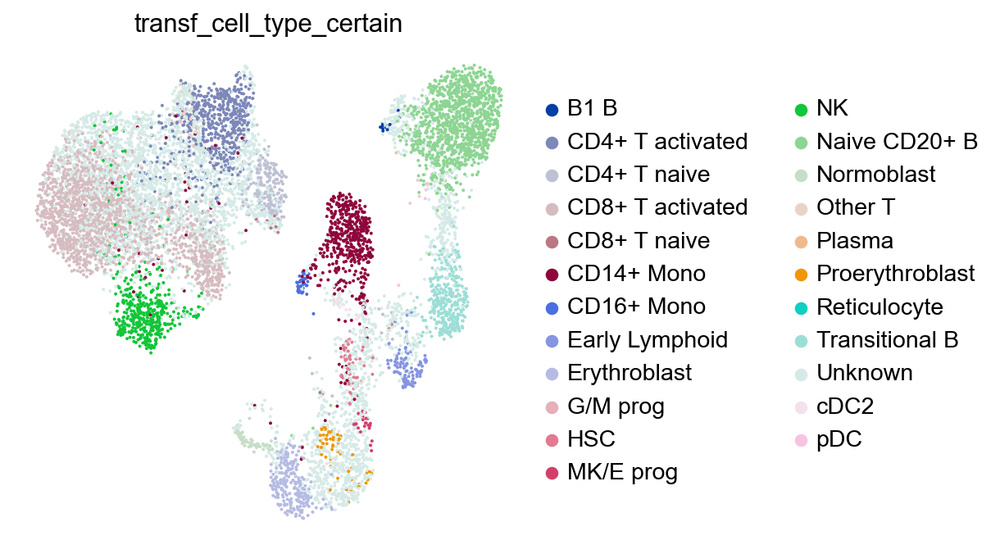

In [101]:
sc.pl.umap(adata, color="transf_cell_type_certain", frameon=False)

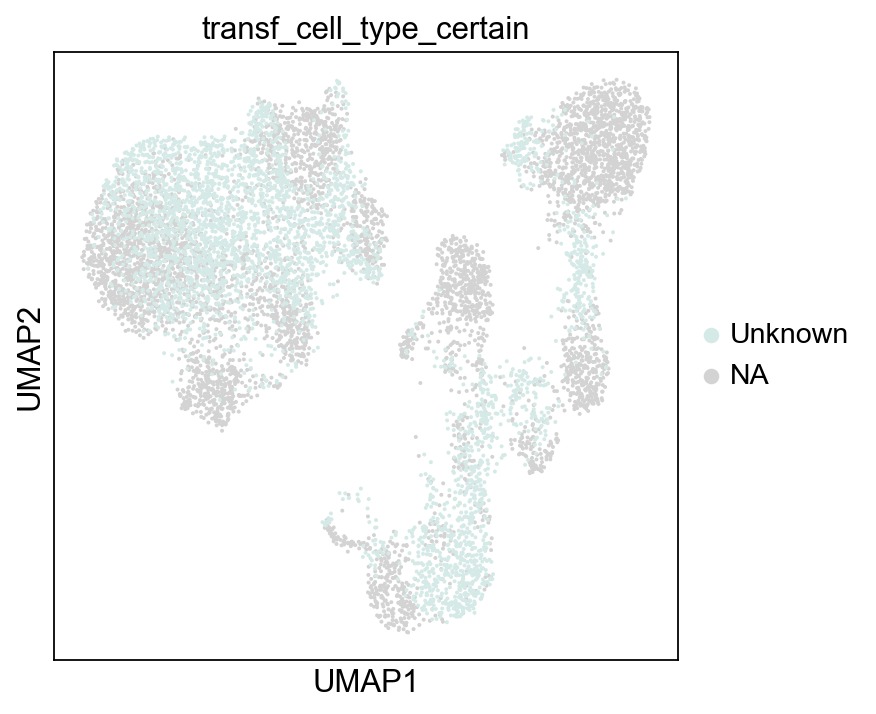

In [102]:
sc.pl.umap(adata, color="transf_cell_type_certain", groups="Unknown")

셀이 꽤 많네요! 이 셀들은 특히 신중하게 수작업으로 검토해야 합니다. 

하지만 "미확인 셀"을 둘러싼 불확실성이 낮은 주석만으로도 각 셀이 어떤 유형의 셀에 속할지 대략적으로 짐작할 수 있습니다.

이제 좀 더 구체적인 주석을 살펴보겠습니다. 

몇 가지 세포 유형(여기서는 무작위로 선택)을 대상으로 참조 전달된 주석이 위에서 언급한 알려진 마커 유전자와 얼마나 일치하는지 확인할 것입니다. 

실제로는 모든 주석에 대해 체계적으로 이 작업을 수행해야 합니다!

In [103]:
cell_types_to_check = [
    "CD14+ Mono",
    "cDC2",
    "NK",
    "B1 B",
    "CD4+ T activated",
    "T naive",
    "MK/E prog",
]

편리하게도, 각 세포 유형에 대한 마커가 사전에 있습니다. 새로 주석을 단 모든 세포 유형에 대한 마커 발현을 그래프로 그려 보겠습니다.

 마커 발현은 일반적으로 자동 주석과 일치하며, 이는 좋은 신호입니다!

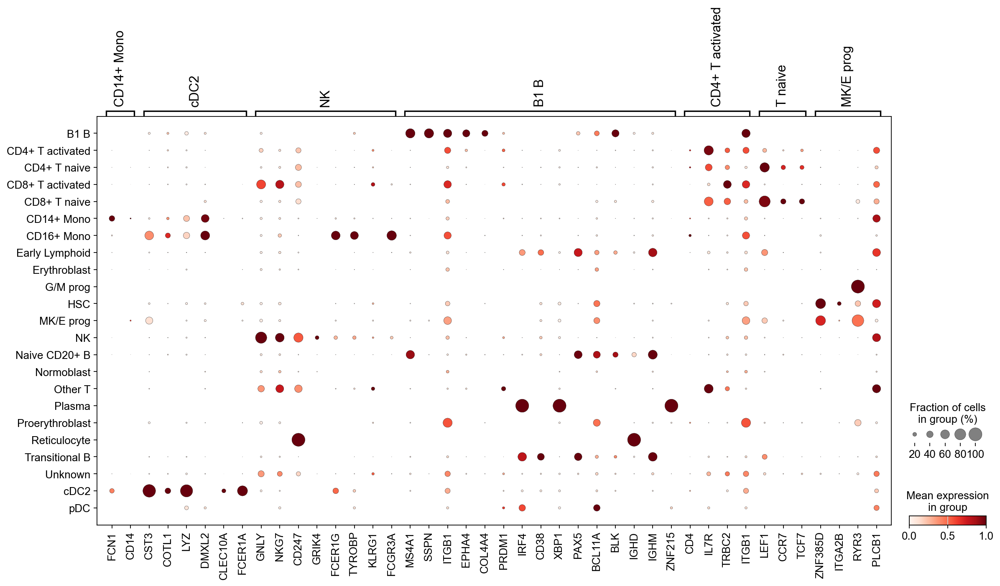

In [104]:
sc.pl.dotplot(
    adata,
    var_names={
        ct: marker_genes_in_data[ct] for ct in cell_types_to_check
    },  # gene names grouped by cell type in a dictionary
    groupby="transf_cell_type_certain",
    standard_scale="var",  # normalize gene scores from 0 to 1
)

보시다시피, 마커 그룹은 일반적으로 일치하는 라벨이 표시된 세포에서 가장 많이 발현됩니다.

즉, 이 라벨들은 (적어도 부분적으로는) 정확할 가능성이 높습니다 !

불확실성으로 채워진 UMAP으로 다시 한 번 돌아가 보겠습니다.

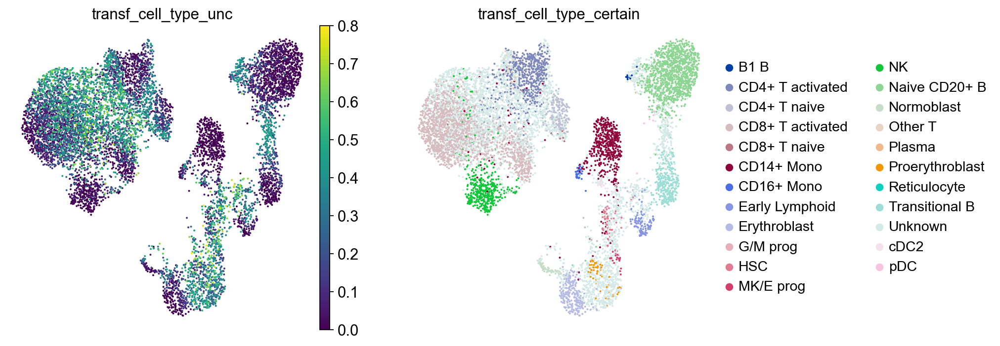

In [105]:
sc.pl.umap(
    adata, color=["transf_cell_type_unc","transf_cell_type_certain"], frameon=False
)

불확실성은 알고리즘이 세포가 속하는 세포 유형에 대해 불확실한 영역(예: 두 개의 주석이 달린 표현형 사이에 있기 때문)을 식별하는 데 도움이 될 뿐만 아니라 보이지 않는 세포 유형이나 새로운 세포 상태를 강조할 수도 있습니다. 

예를 들어, 참조는 건강한 세포로 구성되어 있는 반면 쿼리는 질병에 걸린 샘플에서 가져온 것일 수 있습니다. 

불확실성 점수는 질병 특정 세포 상태를 강조할 수 있는데, 이는 참조에서 일관되게 단일 세포 유형에서 나온 이웃이 없을 수 있기 때문입니다. 

특히 참조가 대규모 데이터 세트에 기반하는 경우 불확실성 점수는 조사하는 데 흥미로운 쿼리 데이터의 일부를 표시하는 데 유용합니다. 

따라서 참조 기반 레이블 전송은 데이터에 주석을 달 수 있을 뿐만 아니라 데이터 탐색 및 해석 속도를 높일 수도 있습니다. 그러나 모든 지표와 마찬가지로 이러한 불확실성 점수는 종종 완벽하지 않으며 

어떤 경우에는 새로운 세포 유형이나 상태를 강조하지 못합니다. 

불확실성 지표에 대한 더 광범위한 논의는 예를 들어 [ Engelmann et al. , 2022 ]를 참조하십시오 .

이 노트북에서 논의된 다른 방법과 마찬가지로, 전송된 주석의 품질은 "훈련 데이터"(이 경우 참조)와 주석의 품질, 모델의 품질, 그리고 사용자 데이터와 훈련 데이터의 일치 여부에 따라 달라집니다!

따라서 전송된 주석의 품질은 항상 마커 유전자 발현을 사용한 수동 검사를 통해 검증해야 하며, 초기 주석의 개선이 필요할 수 있습니다.

마지막으로, 원하는 경우 adata 객체를 저장합니다.



In [106]:
adata.write("./annotation_adata_out.h5ad")

TypeError: Can't implicitly convert non-string objects to strings

In [107]:
# adata.obs['transf_cell_type_unc'] 컬럼 안에 문자열이 아닌 Python 객체가 섞여 있음.

adata.obs["transf_cell_type_unc"].head()
adata.obs["transf_cell_type_unc"].apply(type).value_counts()

transf_cell_type_unc
<class 'numpy.float64'>    8824
<class 'int'>               546
Name: count, dtype: int64

In [109]:
adata.uns.keys()

odict_keys(['pca', 'neighbors', 'umap', 'leiden_1', 'leiden_1_colors', 'leiden_2', 'leiden_2_colors', 'manual_celltype_annotation_colors', 'dea_leiden_2', 'dendrogram_leiden_2', 'dea_leiden_2_filtered', 'celltypist_cell_label_coarse_colors', 'celltypist_cell_label_fine_colors', 'dendrogram_celltypist_cell_label_fine', 'transf_cell_type_colors', 'transf_cell_type_certain_colors'])

In [112]:
adata.uns["dea_leiden_2_filtered"].keys()
adata.uns["dea_leiden_2_filtered"]["names"][:3]
type(adata.uns["dea_leiden_2_filtered"]["names"])

numpy.recarray